# Convolutional Neural Networks

Sam Foreman
[](https://orcid.org/0000-0002-9981-0876)
(\[[ANL](https://www.anl.gov/)\](<https://alcf.anl.gov/about/people/sam-foreman>))  
Huihuo ZhengCorey AdamsBethany Lusch2025-07-22

Up until transformers, convolutions were *the* state of the art in
computer vision.  
In many ways and applications they still are!

Large Language Models, which are what we’ll focus on the rest of the
series after this lecture, are really good at ordered, \*tokenized data.
But there is lots of data that isn’t *implicitly* ordered like `images`,
and their more general cousins `graphs`.

Today’s lecture focuses on computer vision models, and particularly on
convolutional neural networks. There are a ton of applications you can
do with these, and not nearly enough time to get into them. Check out
the extra references file to see some publications to get you started if
you want to learn more.

Tip: this notebook is much faster on the GPU!

## Convolutional Networks: A brief historical context

<figure>
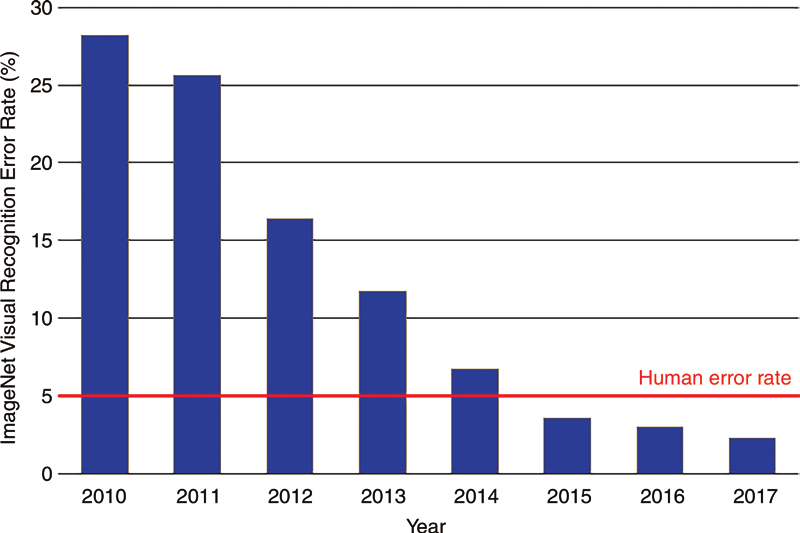
<figcaption aria-hidden="true">ImageNet Accuracy by Yearh</figcaption>
</figure>

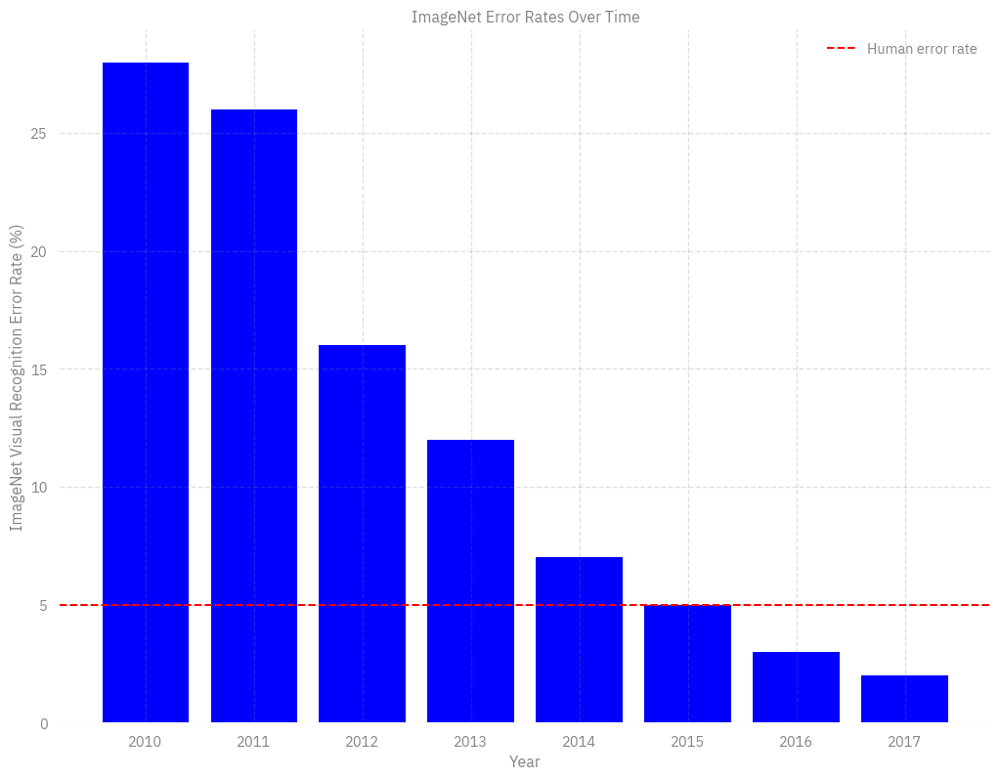

In [1]:
import ambivalent

import matplotlib.pyplot as plt
import seaborn as sns

plt.style.use(ambivalent.STYLES['ambivalent'])
sns.set_context("notebook")


# Data
years = [2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017]
image_net_error_rates = [28, 26, 16, 12, 7, 5, 3, 2]
data = {
    2010: 28,
    2011: 26,
    2012: 16,
    2013: 12,
    2014: 7,
    2015: 3,
    2016: 2.3,
    2017: 2.1
}
human_error_rate = 5

# Create bar plot
plt.bar(years, image_net_error_rates, color='blue')

# Add human error rate line
plt.axhline(y=human_error_rate, color='red', linestyle='--', label='Human error rate')

# Labels and title
plt.xlabel('Year')
plt.ylabel('ImageNet Visual Recognition Error Rate (%)')
plt.title('ImageNet Error Rates Over Time')
plt.legend()

# Display plot
plt.show()

[reference](https://www.researchgate.net/publication/332452649_A_Roadmap_for_Foundational_Research_on_Artificial_Intelligence_in_Medical_Imaging_From_the_2018_NIHRSNAACRThe_Academy_Workshop)

In [2]:
import torch, torchvision

## Convolutional Building Blocks

We’re going to go through some examples of building blocks for
convolutional networks. To help illustate some of these, let’s use an
image for examples:

In [3]:
from PIL import Image
# wget line useful in Google Colab
! wget https://raw.githubusercontent.com/argonne-lcf/ai-science-training-series/main/03_advanced_neural_networks/ALCF-Staff.jpg
alcf_image = Image.open("ALCF-Staff.jpg")

--2025-07-22 14:00:42--  https://raw.githubusercontent.com/argonne-lcf/ai-science-training-series/main/03_advanced_neural_networks/ALCF-Staff.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 417835 (408K) [image/jpeg]
Saving to: ‘ALCF-Staff.jpg.24’

ALCF-Staff.jpg.24     0%[                    ]       0  --.-KB/s               ALCF-Staff.jpg.24   100%[===================>] 408.04K  --.-KB/s    in 0.02s   

2025-07-22 14:00:43 (23.2 MB/s) - ‘ALCF-Staff.jpg.24’ saved [417835/417835]


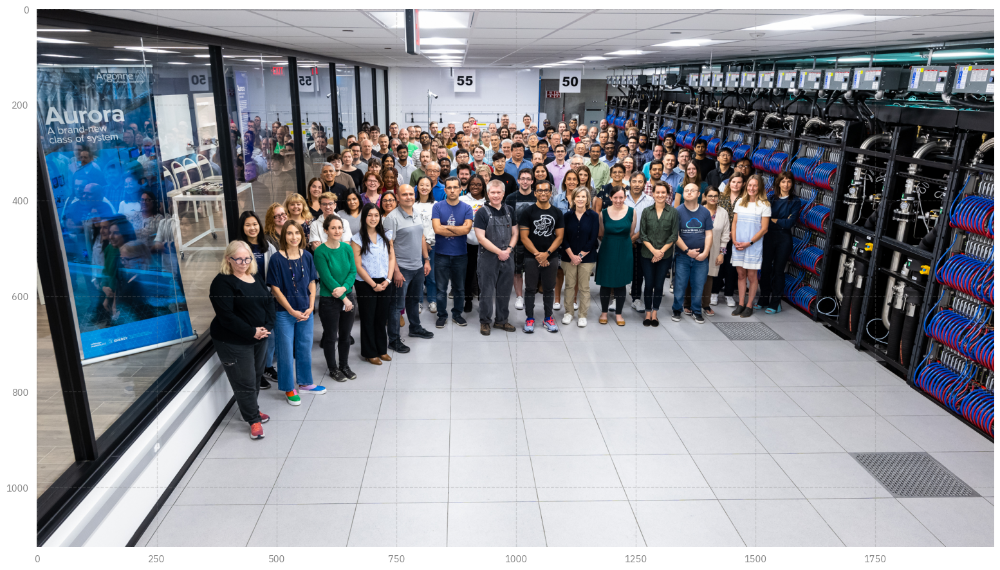

In [4]:
from matplotlib import pyplot as plt
figure = plt.figure(figsize=(20,20))
plt.imshow(alcf_image)
plt.show()

### Convolutions

Convolutions are a restriction of - and a specialization of - dense
linear layers. A convolution of an image produces another image, and
each output pixel is a function of only it’s local neighborhood of
points. This is called an *inductive bias* and is a big reason why
convolutions work for image data: neighboring pixels are correlated and
you can operate on just those pixels at a time.

See examples of convolutions
[here](https://github.com/vdumoulin/conv_arithmetic)

<figure>
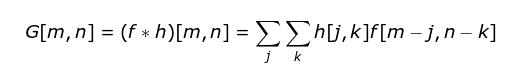
<figcaption aria-hidden="true">image-2.png</figcaption>
</figure>

<figure>
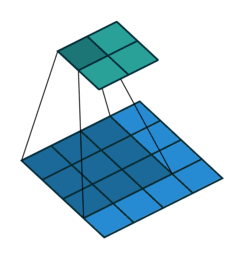
<figcaption aria-hidden="true">image.png</figcaption>
</figure>

torch.Size([1, 3, 1111, 1986])
torch.Size([1, 3, 1125, 2000])

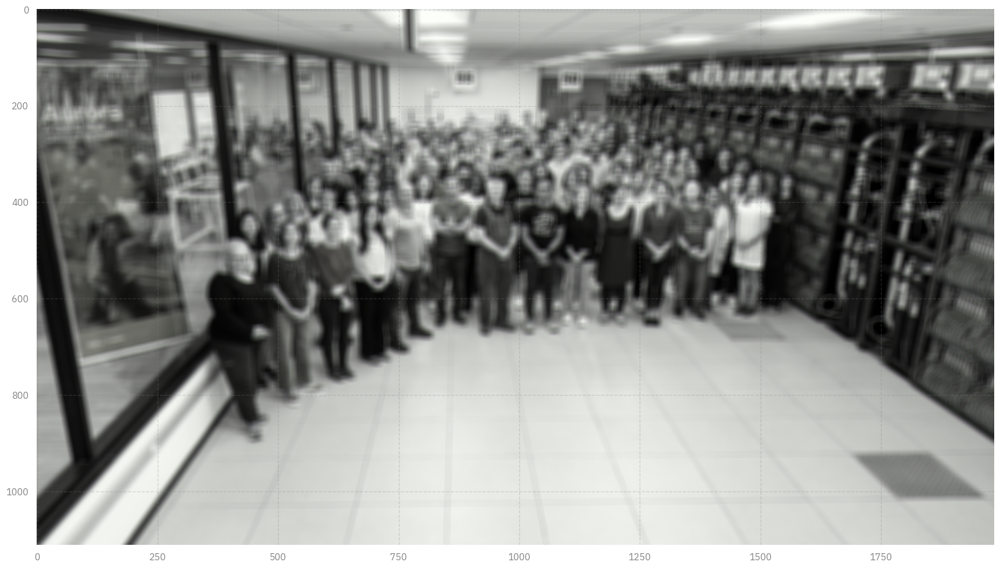

In [5]:
# Let's apply a convolution to the ALCF Staff photo:
alcf_tensor = torchvision.transforms.ToTensor()(alcf_image)

# Reshape the tensor to have a batch size of 1:
alcf_tensor = alcf_tensor.reshape((1,) + alcf_tensor.shape)

# Create a random convolution:
# shape is: (channels_in, channels_out, kernel_x, kernel_y)
conv_random = torch.rand((3,3,15,15))

alcf_rand = torch.nn.functional.conv2d(alcf_tensor, conv_random)
alcf_rand = (1./alcf_rand.max()) * alcf_rand
print(alcf_rand.shape)
alcf_rand = alcf_rand.reshape(alcf_rand.shape[1:])

print(alcf_tensor.shape)

rand_image = alcf_rand.permute((1,2,0)).cpu()

figure = plt.figure(figsize=(20,20))

plt.imshow(rand_image)

### Normalization

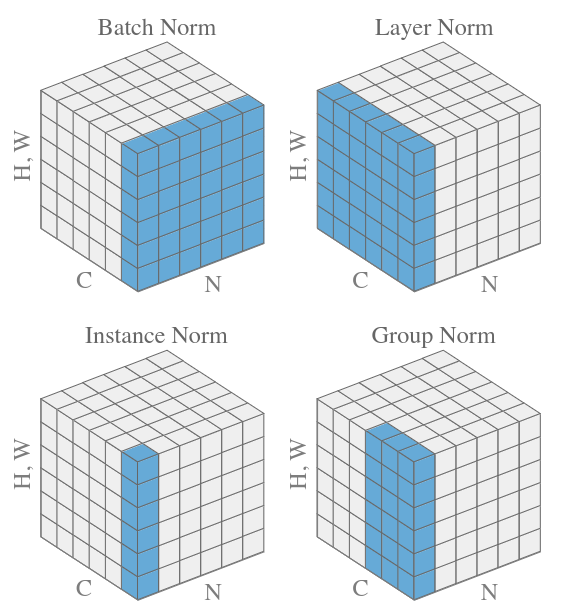 Reference:
[Normalizations](https://arxiv.org/pdf/1903.10520.pdf)

Normalization is the act of transforming the mean and moment of your
data to standard values (usually 0.0 and 1.0). It’s particularly useful
in machine learning since it stabilizes training, and allows higher
learning rates.

<figure>
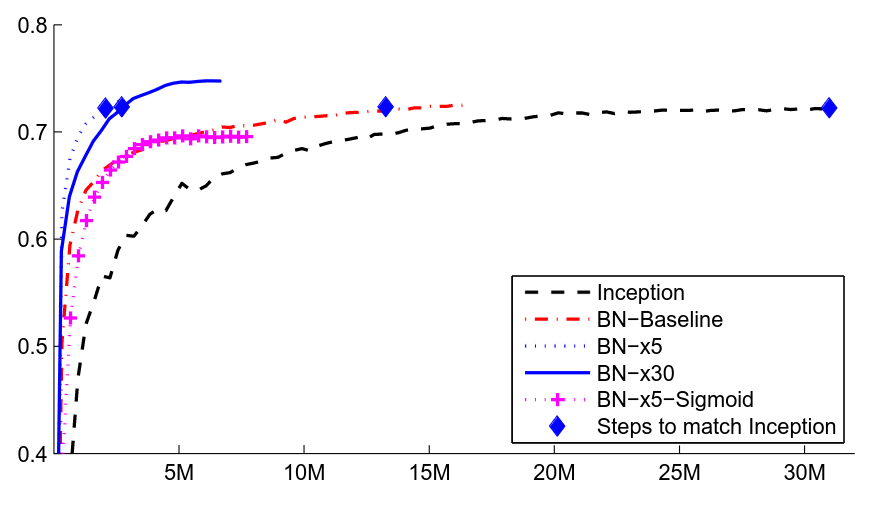
<figcaption aria-hidden="true">Batch Normalization accelerates
training</figcaption>
</figure>

Reference: [Batch Norm](https://arxiv.org/pdf/1502.03167.pdf)

torch.Size([1, 3, 1125, 2000])

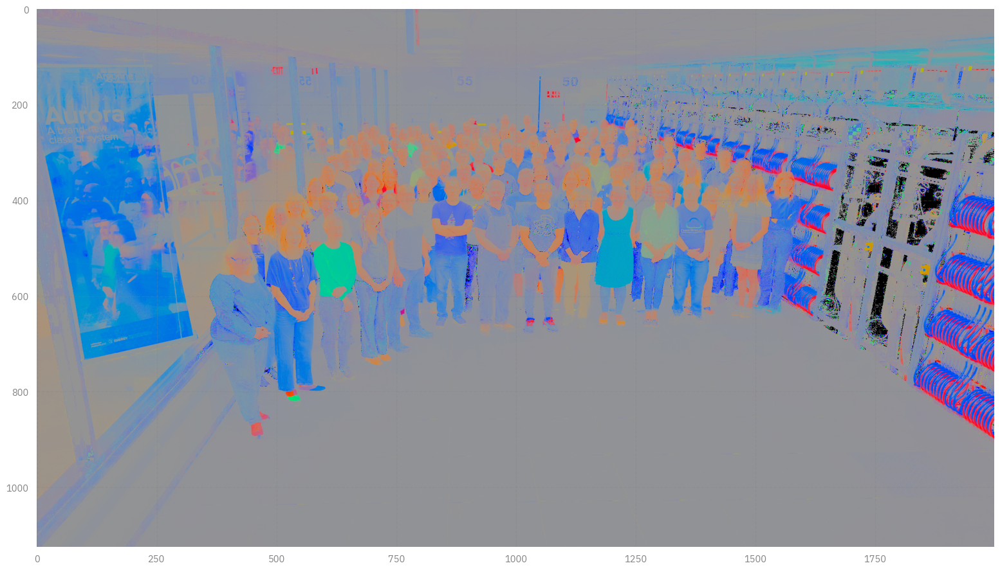

In [6]:
# Let's apply a normalization to the ALCF Staff photo:
alcf_tensor = torchvision.transforms.ToTensor()(alcf_image)

# Reshape the tensor to have a batch size of 1:
alcf_tensor = alcf_tensor.reshape((1,) + alcf_tensor.shape)


alcf_rand = torch.nn.functional.normalize(alcf_tensor)
alcf_rand = alcf_rand.reshape(alcf_rand.shape[1:])

print(alcf_tensor.shape)

rand_image = alcf_rand.permute((1,2,0)).cpu()

figure = plt.figure(figsize=(20,20))

plt.imshow(rand_image)

### Downsampling (And upsampling)

Downsampling is a critical component of convolutional and many vision
models. Because of the local-only nature of convolutional filters,
learning large-range features can be too slow for convergence.
Downsampling of layers can bring information from far away closer,
effectively changing what it means to be “local” as the input to a
convolution.

<figure>
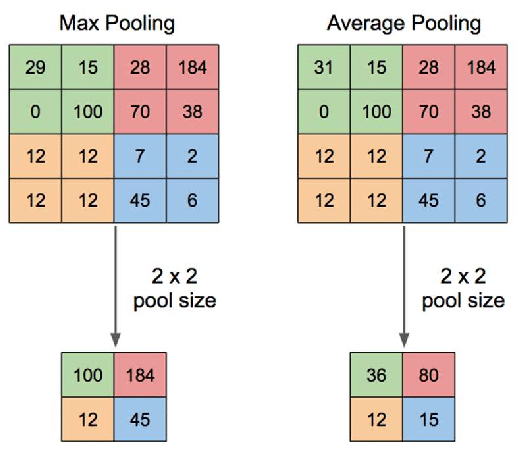
<figcaption aria-hidden="true">Convolutional Pooling</figcaption>
</figure>

[Reference](https://www.researchgate.net/publication/333593451_Application_of_Transfer_Learning_Using_Convolutional_Neural_Network_Method_for_Early_Detection_of_Terry's_Nail)

torch.Size([1, 3, 1125, 2000])

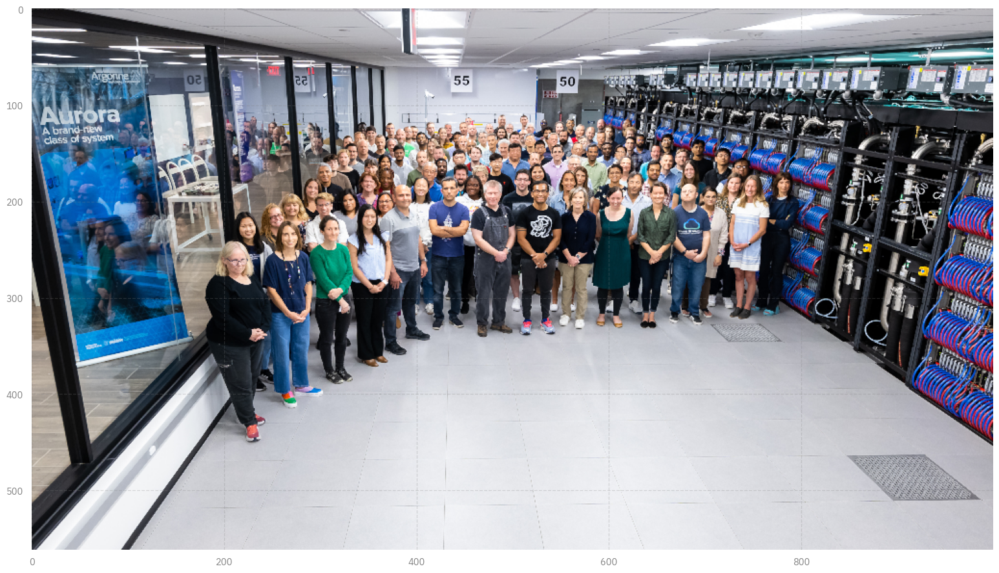

In [7]:
# Let's apply a normalization to the ALCF Staff photo:
alcf_tensor = torchvision.transforms.ToTensor()(alcf_image)

# Reshape the tensor to have a batch size of 1:
alcf_tensor = alcf_tensor.reshape((1,) + alcf_tensor.shape)


alcf_rand = torch.nn.functional.max_pool2d(alcf_tensor, 2)
alcf_rand = alcf_rand.reshape(alcf_rand.shape[1:])

print(alcf_tensor.shape)

rand_image = alcf_rand.permute((1,2,0)).cpu()

figure = plt.figure(figsize=(20,20))

plt.imshow(rand_image)

### Residual Connections

One issue, quickly encountered when making convolutional networks deeper
and deeper, is the “Vanishing Gradients” problem. As layers were stacked
on top of each other, the size of updates dimished at the earlier layers
of a convolutional network. The paper “Deep Residual Learning for Image
Recognition” solved this by introduction “residual connections” as skip
layers.

Reference: [Deep Residual Learning for Image
Recognition](https://arxiv.org/pdf/1512.03385.pdf)

<figure>
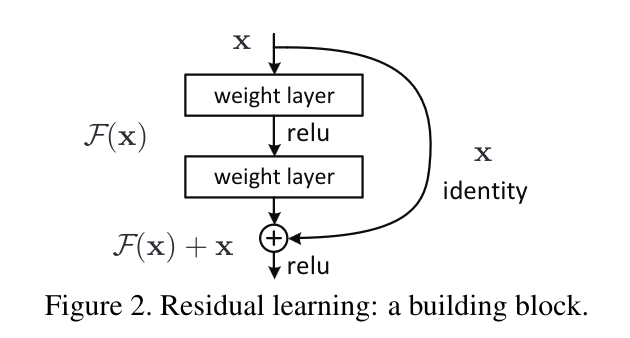
<figcaption aria-hidden="true">Residual Layer</figcaption>
</figure>

Compare the performance of the models before and after the introduction
of these layers:

<figure>
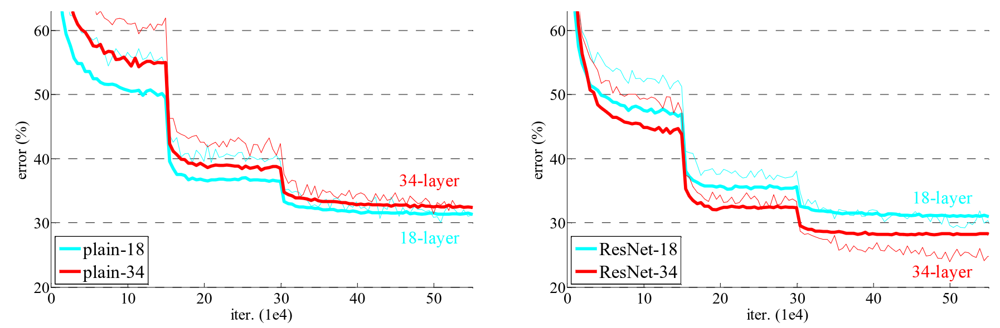
<figcaption aria-hidden="true">Resnet Performance vs. Plain network
performance</figcaption>
</figure>

If you have time to read only one paper on computer vision, make it this
one! Resnet was the first model to beat human accuracy on ImageNet and
is one of the most impactful papers in AI ever published.

## Building a ConvNet

In this section we’ll build and apply a conv net to the mnist dataset.
The layers here are loosely based off of the ConvNext architecture. Why?
Because we’re getting into LLM’s soon, and this ConvNet uses LLM
features. ConvNext is an update to the ResNet architecture that
outperforms it.

[ConvNext](https://arxiv.org/abs/2201.03545)

The dataset here is CIFAR-10 - slightly harder than MNIST but still
relatively easy and computationally tractable.

In [8]:
from torchvision.transforms import v2
training_data = torchvision.datasets.CIFAR10(
    # Polaris: root="/lus/eagle/projects/datasets/CIFAR-10/",
    # Polaris: download=False,
    root="data",
    download=True,
    train=True,
    transform=v2.Compose([
        v2.ToTensor(),
        v2.RandomHorizontalFlip(),
        v2.RandomResizedCrop(size=32, scale=[0.85,1.0], antialias=False),
        v2.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    ])
)

test_data = torchvision.datasets.CIFAR10(
    # Polaris: root="/lus/eagle/projects/datasets/CIFAR-10/",
    # Polaris: download=False,
    root="data",
    download=True,
    train=False,
    transform=torchvision.transforms.ToTensor()
)

training_data, validation_data = torch.utils.data.random_split(training_data, [0.8, 0.2], generator=torch.Generator().manual_seed(55))

batch_size = 128

# The dataloader makes our dataset iterable 
train_dataloader = torch.utils.data.DataLoader(training_data, 
    batch_size=batch_size, 
    pin_memory=True,
    shuffle=True, 
    num_workers=2)
val_dataloader = torch.utils.data.DataLoader(validation_data, 
    batch_size=batch_size, 
    pin_memory=True,
    shuffle=False, 
    num_workers=2)

/Users/samforeman/projects/saforem2/intro-hpc-bootcamp-2025/.venv/lib/python3.13/site-packages/torchvision/transforms/v2/_deprecated.py:42: UserWarning: The transform `ToTensor()` is deprecated and will be removed in a future release. Instead, please use `v2.Compose([v2.ToImage(), v2.ToDtype(torch.float32, scale=True)])`.Output is equivalent up to float precision.
  warnings.warn(

In [9]:
from matplotlib import pyplot as plt
%matplotlib inline

/Users/samforeman/projects/saforem2/intro-hpc-bootcamp-2025/.venv/lib/python3.13/site-packages/torch/utils/data/dataloader.py:683: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)

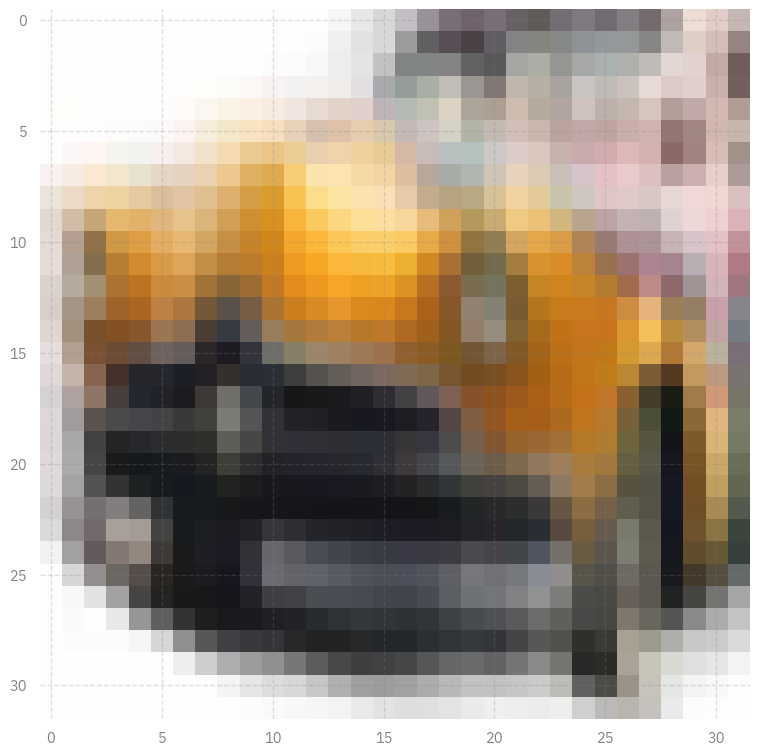

In [10]:
batch, (X, Y) = next(enumerate(train_dataloader))
plt.imshow(X[0].cpu().permute((1,2,0))); plt.show()

This code below is important as our models get bigger: this is wrapping
the pytorch data loaders to put the data onto the GPU!

In [11]:
dev = torch.device(
    "cuda") if torch.cuda.is_available() else torch.device("cpu")


def preprocess(x, y):
    # CIFAR-10 is *color* images so 3 layers!
    return x.view(-1, 3, 32, 32).to(dev), y.to(dev)


class WrappedDataLoader:
    def __init__(self, dl, func):
        self.dl = dl
        self.func = func

    def __len__(self):
        return len(self.dl)

    def __iter__(self):
        for b in self.dl:
            yield (self.func(*b))


train_dataloader = WrappedDataLoader(train_dataloader, preprocess)
val_dataloader = WrappedDataLoader(val_dataloader, preprocess)

In [12]:
from torch import nn


class Downsampler(nn.Module):

    def __init__(self, in_channels, out_channels, shape, stride=2):
        super(Downsampler, self).__init__()

        self.norm = nn.LayerNorm([in_channels, *shape])

        self.downsample = nn.Conv2d(
            in_channels=in_channels, 
            out_channels=out_channels,
            kernel_size = stride,
            stride = stride,
        )

    def forward(self, inputs):


        return self.downsample(self.norm(inputs))



class ConvNextBlock(nn.Module):
    """This block of operations is loosely based on this paper:

    """


    def __init__(self, in_channels, shape):
        super(ConvNextBlock, self).__init__()

        # Depthwise, seperable convolution with a large number of output filters:
        self.conv1 = nn.Conv2d(in_channels=in_channels, 
                                     out_channels=in_channels, 
                                     groups=in_channels,
                                     kernel_size=[7,7],
                                     padding='same' )

        self.norm = nn.LayerNorm([in_channels, *shape])

        # Two more convolutions:
        self.conv2 = nn.Conv2d(in_channels=in_channels, 
                                     out_channels=4*in_channels,
                                     kernel_size=1)

        self.conv3 = nn.Conv2d(in_channels=4*in_channels, 
                                     out_channels=in_channels,
                                     kernel_size=1
                                     )


    def forward(self, inputs):
        x = self.conv1(inputs)

        # The normalization layer:
        x = self.norm(x)

        x = self.conv2(x)

        # The non-linear activation layer:
        x = torch.nn.functional.gelu(x)

        x = self.conv3(x)

        # This makes it a residual network:
        return x + inputs


class Classifier(nn.Module):


    def __init__(self, n_initial_filters, n_stages, blocks_per_stage):
        super(Classifier, self).__init__()

        # This is a downsampling convolution that will produce patches of output.

        # This is similar to what vision transformers do to tokenize the images.
        self.stem = nn.Conv2d(in_channels=3,
                                    out_channels=n_initial_filters,
                                    kernel_size=1,
                                    stride=1)

        current_shape = [32, 32]

        self.norm1 = nn.LayerNorm([n_initial_filters,*current_shape])
        # self.norm1 = WrappedLayerNorm()

        current_n_filters = n_initial_filters

        self.layers = nn.Sequential()
        for i, n_blocks in enumerate(range(n_stages)):
            # Add a convnext block series:
            for _ in range(blocks_per_stage):
                self.layers.append(ConvNextBlock(in_channels=current_n_filters, shape=current_shape))
            # Add a downsampling layer:
            if i != n_stages - 1:
                # Skip downsampling if it's the last layer!
                self.layers.append(Downsampler(
                    in_channels=current_n_filters, 
                    out_channels=2*current_n_filters,
                    shape = current_shape,
                    )
                )
                # Double the number of filters:
                current_n_filters = 2*current_n_filters
                # Cut the shape in half:
                current_shape = [ cs // 2 for cs in current_shape]



        self.head = nn.Sequential(
            nn.Flatten(),
            nn.LayerNorm(current_n_filters),
            nn.Linear(current_n_filters, 10)
        )
        # self.norm2 = nn.InstanceNorm2d(current_n_filters)
        # # This brings it down to one channel / class
        # self.bottleneck = nn.Conv2d(in_channels=current_n_filters, out_channels=10, 
        #                                   kernel_size=1, stride=1)

    def forward(self, inputs):

        x = self.stem(inputs)
        # Apply a normalization after the initial patching:
        x = self.norm1(x)

        # Apply the main chunk of the network:
        x = self.layers(x)

        # Normalize and readout:
        x = nn.functional.avg_pool2d(x, x.shape[2:])
        x = self.head(x)

        return x



        # x = self.norm2(x)
        # x = self.bottleneck(x)

        # # Average pooling of the remaining spatial dimensions (and reshape) makes this label-like:
        # return nn.functional.avg_pool2d(x, kernel_size=x.shape[-2:]).reshape((-1,10))

In [13]:
!pip install torchinfo # if not on Polaris

In [14]:
model = Classifier(32, 4, 2).to(device=dev)

from torchinfo import summary

print(summary(model, input_size=(batch_size, 3, 32, 32)))

Layer (type:depth-idx)                   Output Shape              Param #
Classifier                               [128, 10]                 --
├─Conv2d: 1-1                            [128, 32, 32, 32]         128
├─LayerNorm: 1-2                         [128, 32, 32, 32]         65,536
├─Sequential: 1-3                        [128, 256, 4, 4]          --
│    └─ConvNextBlock: 2-1                [128, 32, 32, 32]         --
│    │    └─Conv2d: 3-1                  [128, 32, 32, 32]         1,600
│    │    └─LayerNorm: 3-2               [128, 32, 32, 32]         65,536
│    │    └─Conv2d: 3-3                  [128, 128, 32, 32]        4,224
│    │    └─Conv2d: 3-4                  [128, 32, 32, 32]         4,128
│    └─ConvNextBlock: 2-2                [128, 32, 32, 32]         --
│    │    └─Conv2d: 3-5                  [128, 32, 32, 32]         1,600
│    │    └─LayerNorm: 3-6               [128, 32, 32, 32]         65,536
│    │    └─Conv2d: 3-7                  [128, 128, 32, 32] 

In [15]:
def evaluate(dataloader, model, loss_fn, val_bar):
    # Set the model to evaluation mode - some NN pieces behave differently during training
    # Unnecessary in this situation but added for best practices
    model.eval()
    size = len(dataloader)
    num_batches = len(dataloader)
    loss, correct = 0, 0

    # We can save computation and memory by not calculating gradients here - we aren't optimizing 
    with torch.no_grad():
        # loop over all of the batches
        for X, y in dataloader:

            pred = model(X)
            loss += loss_fn(pred, y).item()
            # how many are correct in this batch? Tracking for accuracy 
            correct += (pred.argmax(1) == y).type(torch.float).sum().item()
            val_bar.update()

    loss /= num_batches
    correct /= (size*batch_size)

    accuracy = 100*correct
    return accuracy, loss

In [16]:
def train_one_epoch(dataloader, model, loss_fn, optimizer, progress_bar):
    model.train()
    for batch, (X, y) in enumerate(dataloader):
        # forward pass
        pred = model(X)
        loss = loss_fn(pred, y)

        # backward pass calculates gradients
        loss.backward()

        # take one step with these gradients
        optimizer.step()

        # resets the gradients 
        optimizer.zero_grad()

        progress_bar.update()

In [17]:
loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(model.parameters(), lr=0.001, weight_decay=0.01)

In [18]:
import time
import ezpz
from tqdm.notebook import tqdm

def train_step(x, y):
    t0 = time.perf_counter()
    # Forward pass
    pred = model(x)
    loss = loss_fn(pred, y)
    t1 = time.perf_counter()

    # Backward pass
    loss.backward()
    t2 = time.perf_counter()

    # Update weights
    optimizer.step()
    t3 = time.perf_counter()

    # Reset gradients
    optimizer.zero_grad()
    t4 = time.perf_counter()

    return loss.item(), {
        "dtf": t1 - t0,
        "dtb": t2 - t1,
        "dtu": t3 - t2,
        "dtz": t4 - t3,
    }

logger = ezpz.get_logger("3-conv-nets")
history = ezpz.History()
for i in range(5):
    t0 = time.perf_counter()
    x, y = next(iter(train_dataloader))
    t1 = time.perf_counter()
    loss, dt = train_step(x, y)
    logger.info(
        history.update(
            {
                "iter": i,
                "loss": loss,
                "dtd": t1 - t0,
                **dt,
            }
        )
    )

[ 2025-07-22 14:00:59,904358 ][ I ][ ezpz / __init__ : 265 : ezpz ] Setting logging level to 'INFO' on 'RANK == 0'

[ 2025-07-22 14:00:59,906271 ][ I ][ ezpz / __init__ : 266 : ezpz ] Setting logging level to 'CRITICAL' on all others 'RANK != 0'

[ 2025-07-22 14:01:10,725585 ][ I ][ ipykernel_13807 / 1183336067 : 38 : 3-conv-nets ] iter = 0 loss = 2.584200 dtd = 3.674206 dtf = 0.679387 dtb = 6.460657 dtu = 0.002458 dtz = 0.000348

[ 2025-07-22 14:01:21,368772 ][ I ][ ipykernel_13807 / 1183336067 : 38 : 3-conv-nets ] iter = 1 loss = 2.582710 dtd = 3.861113 dtf = 0.659052 dtb = 6.118463 dtu = 0.001862 dtz = 0.000704

[ 2025-07-22 14:01:32,267145 ][ I ][ ipykernel_13807 / 1183336067 : 38 : 3-conv-nets ] iter = 2 loss = 2.404449 dtd = 3.811609 dtf = 0.648729 dtb = 6.431707 dtu = 0.002801 dtz = 0.001263

[ 2025-07-22 14:01:43,789540 ][ I ][ ipykernel_13807 / 1183336067 : 38 : 3-conv-nets ] iter = 3 loss = 2.410168 dtd = 4.323473 dtf = 1.004887 dtb = 6.189096 dtu = 0.002272 dtz = 0.000337

[ 2025-07-22 14:01:55,581574 ][ I ][ ipykernel_13807 / 1183336067 : 38 : 3-conv-nets ] iter = 4 loss = 2.329301 dtd = 4.321828 dtf = 0.822958 dtb = 6.640649 dtu = 0.003710 dtz = 0.000595

``` python
# epochs = 1
# for j in range(epochs):
#     with tqdm(total=len(train_dataloader), position=0, leave=True, desc=f"Train Epoch {j}") as train_bar:
#         train_one_epoch(train_dataloader, model, loss_fn, optimizer, train_bar)
#
#     # checking on the training & validation loss & accuracy 
#     # for training data - only once every 5 epochs (takes a while) 
#     if j % 5 == 0:
#         with tqdm(total=len(train_dataloader), position=0, leave=True, desc=f"Validate (train) Epoch {j}") as train_eval:
#             acc, loss = evaluate(train_dataloader, model, loss_fn, train_eval)
#             print(f"Epoch {j}: training loss: {loss:.3f}, accuracy: {acc:.3f}")
#
#     with tqdm(total=len(val_dataloader), position=0, leave=True, desc=f"Validate Epoch {j}") as val_bar:
#         acc_val, loss_val = evaluate(val_dataloader, model, loss_fn, val_bar)
#         print(f"Epoch {j}: validation loss: {loss_val:.3f}, accuracy: {acc_val:.3f}")
```

## Homework 1:

In this notebook, we’ve learned about some basic convolutional networks
and trained one on CIFAR-10 images. It did … OK. There is significant
overfitting of this model. There are some ways to address that, but we
didn’t have time to get into that in this session.

Meanwhile, your homework (part 1) for this week is to try to train the
model again but with a different architecture. Change one or more of the
following: - The number of convolutions between downsampling - The
number of filters in each layer - The initial “patchify” layer - Another
hyper-parameter of your choosing

And compare your final validation accuracy to the accuracy shown here.
Can you beat the validation accuracy shown?

For full credit on the homework, you need to show (via text, or make a
plot) the training and validation data sets’ performance (loss and
accuracy) for all the epochs you train. You also need to explain, in
several sentences, what you changed in the network and why you think it
makes a difference.